## Dash Bootstrap

In [1]:
# Import packages
import dash_bootstrap_components as dbc
import pandas as pd
import plotly.express as px
from dash import Dash, Input, Output, callback, dash_table, dcc, html
import geopandas
import plotly.graph_objects as go
import shapely.geometry as geometry

base_path = "../../FINAL data/"
my_data_path = "../../MY data/"

In [163]:
# # Incorporate data
# df = pd.read_csv(
#     "https://raw.githubusercontent.com/plotly/datasets/master/gapminder2007.csv"
# )

# # Initialize the app - incorporate a Dash Bootstrap theme
# external_stylesheets = [dbc.themes.CERULEAN]
# app = Dash(__name__, external_stylesheets=external_stylesheets)

# # App layout
# app.layout = dbc.Container(
#     [
#         dbc.Row(
#             [
#                 html.Div(
#                     "My First App with Data, Graph, and Controls",
#                     className="text-primary text-center fs-3",
#                 )
#             ]
#         ),
#         dbc.Row(
#             [
#                 dbc.RadioItems(
#                     options=[
#                         {"label": x, "value": x}
#                         for x in ["pop", "lifeExp", "gdpPercap"]
#                     ],
#                     value="lifeExp",
#                     inline=True,
#                     id="radio-buttons-final",
#                 )
#             ]
#         ),
#         dbc.Row(
#             [
#                 dbc.Col(
#                     [
#                         dash_table.DataTable(
#                             data=df.to_dict("records"),
#                             page_size=12,
#                             style_table={"overflowX": "auto"},
#                         )
#                     ],
#                     width=6,
#                 ),
#                 dbc.Col([dcc.Graph(figure={}, id="my-first-graph-final")], width=6),
#             ]
#         ),
#     ],
#     fluid=True,
# )


# # Add controls to build the interaction
# @callback(
#     Output(component_id="my-first-graph-final", component_property="figure"),
#     Input(component_id="radio-buttons-final", component_property="value"),
# )
# def update_graph(col_chosen):
#     fig = px.histogram(df, x="continent", y=col_chosen, histfunc="avg")
#     return fig


# # Run the app
# if __name__ == "__main__":
#     app.run(debug=True, use_reloader=False)

## GeoJSON

In [164]:
fileName = "user_schema.lesnye_kv_3051.geojson"

path_to_json = my_data_path + "Лесные кварталы/" + fileName

gdf = geopandas.read_file(path_to_json)

In [165]:
gdf.head()

,name_in,name_uch_l,in_dacha,name_in_ru,dacha_ru,uch_l_ru,kv_num,id,geometry
0,Alarskoe,Alarskoe,None,Аларское,Аларская,Аларское,28,22562,"MULTIPOLYGON (((102.37619 53.25439, 102.37240 ..."
1,Alarskoe,Alarskoe,None,Аларское,Аларская,Аларское,21,22552,"MULTIPOLYGON (((102.22014 53.31237, 102.22171 ..."
2,Alarskoe,Alarskoe,None,Аларское,Аларская,Аларское,22,22553,"MULTIPOLYGON (((102.23036 53.29569, 102.21632 ..."
3,Alarskoe,Alarskoe,None,Аларское,Аларская,Аларское,23,22554,"MULTIPOLYGON (((102.25694 53.29010, 102.25134 ..."
4,Alarskoe,Alarskoe,None,Аларское,Аларская,Аларское,24,22555,"MULTIPOLYGON (((102.24487 53.28587, 102.24644 ..."


<Axes: >

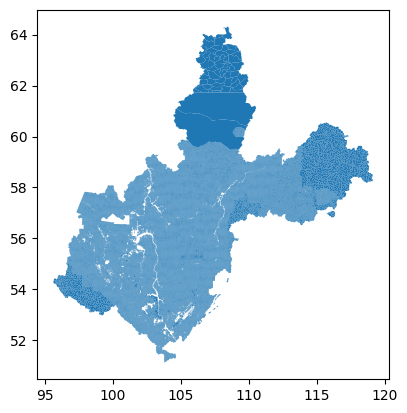

In [166]:
gdf.plot()

Записи с пустой геометрией не только не отображаются сами, но и заставляют plotly не отображать весь датафрейм!

In [167]:
gdf_alar = gdf[gdf['name_in']=='Alarskoe']

In [168]:
map_center_start = {"lat": 53.25439, "lon": 102.37619}
map_zoom_start = 8

quarter_map_fig = px.choropleth_mapbox(gdf_alar, geojson=gdf_alar.geometry,
                                       locations=gdf_alar.index, mapbox_style="carto-positron",
                                       center=map_center_start, zoom=map_zoom_start, opacity=0.25,
                                       color_discrete_sequence=px.colors.qualitative.Set1
                                       #    color=gdf_valid['name_in'],
                                       #    labels={'name_in': 'name'}
                                       )

quarter_map_fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
quarter_map_fig.show()

## Dash mapbox

##### localities

In [11]:
fileName = "localities_Irk_obl.geojson"

path_to_json = my_data_path + "/" + fileName

# ignore_geometry=True
df_loc = geopandas.read_file(path_to_json)

In [12]:
df_loc.head()

,name,type,name_MO,code,distance,ado,id,query,address,poly,valid,locality,geometry
0,Аларь,село сельский,Муниципальное образование «Аларь»,25123902001,44,Аларский,01.���,Аларь село Аларский иркутская область,"Россия, Иркутская область, Аларский район, сел...",0103000020E6100000010000002E000000726891ED7CA1...,1.0,1,"MULTIPOLYGON (((102.52325 53.07457, 102.52335 ..."
1,Александровск,село сельский,Муниципальное образование «Александровск»,25123904001,10,Аларский,01.���,Александровск село Аларский иркутская область,"Россия, Иркутская область, Аларский район, сел...",0103000020E61000000100000050000000C30DF8FC30A9...,1.0,1,"MULTIPOLYGON (((102.64361 53.33077, 102.64394 ..."
2,Алзобей,деревня сельский,Муниципальное образование «Аларь»,25123902002,36,Аларский,01.���,Алзобей деревня Аларский иркутская область,"Россия, Иркутская область, Аларский район, дер...",0103000020E6100000010000001A00000056F0DB10E3A7...,1.0,1,"MULTIPOLYGON (((102.62323 53.11388, 102.62461 ..."
3,Аляты,село сельский,Муниципальное образование «Аляты»,25123907001,55,Аларский,01.���,Аляты село Аларский иркутская область,"Россия, Иркутская область, Аларский район, сел...",0106000020E61000000200000001030000000100000017...,1.0,1,"MULTIPOLYGON (((102.22077 53.19755, 102.22384 ..."
4,Ангарский,поселок сельский,Муниципальное образование «Ангарский»,25123910001,55,Аларский,01.���,Ангарский поселок Аларский иркутская область,"Россия, Иркутская область, Аларский район, пос...",0103000020E6100000010000001500000074ECA012D7D5...,1.0,1,"MULTIPOLYGON (((103.34125 53.46178, 103.34265 ..."


In [13]:
map_center_start = {"lat": 52.25, "lon": 104.3}
map_zoom_start = 6
opacity = 0.15
map_background_options = ["carto-positron", "open-street-map"]
mapbox_style = map_background_options[0]

loc_map_fig = px.choropleth_mapbox(df_loc, geojson=df_loc.geometry, locations=df_loc.index,
                                   mapbox_style=mapbox_style, opacity=opacity,
                                   center=map_center_start, zoom=map_zoom_start,
                                   labels={'type': 'Тип'},
                                   hover_name='name',
                                   hover_data={'type'}
                                   )

loc_map_fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
loc_map_fig.update_geos(fitbounds="locations")

loc_map_fig.show()


localities as simply filled areas

In [14]:
import plotly.graph_objects as go

fig = go.Figure(go.Scattermapbox(
    mode="markers",
    lon=[-73.605], lat=[45.51],
    marker={'size': 20, 'color': ["cyan"]}))

fig.update_layout(
    mapbox={
        'style': "open-street-map",
        'center': {'lon': -73.6, 'lat': 45.5},
        'zoom': 12, 'layers': [{
            'source': {
                'type': "FeatureCollection",
                'features': [{
                    'type': "Feature",
                    'geometry': {
                        'type': "MultiPolygon",
                        'coordinates': [[[
                            [-73.606352888, 45.507489991], [-73.606133883, 45.50687600],
                            [-73.605905904, 45.506773980], [-73.603533905, 45.505698946],
                            [-73.602475870, 45.506856969], [-73.600031904, 45.505696003],
                            [-73.599379992, 45.505389066], [-73.599119902, 45.505632008],
                            [-73.598896977, 45.505514039], [-73.598783894, 45.505617001],
                            [-73.591308727, 45.516246185], [-73.591380782, 45.516280145],
                            [-73.596778656, 45.518690062], [-73.602796770, 45.521348046],
                            [-73.612239983, 45.525564037], [-73.612422919, 45.525642061],
                            [-73.617229085, 45.527751983], [-73.617279234, 45.527774160],
                            [-73.617304713, 45.527741334], [-73.617492052, 45.527498362],
                            [-73.617533258, 45.527512253], [-73.618074188, 45.526759105],
                            [-73.618271651, 45.526500673], [-73.618446320, 45.526287943],
                            [-73.618968507, 45.525698560], [-73.619388002, 45.525216750],
                            [-73.619532966, 45.525064183], [-73.619686662, 45.524889290],
                            [-73.619787038, 45.524770086], [-73.619925742, 45.524584939],
                            [-73.619954486, 45.524557690], [-73.620122362, 45.524377961],
                            [-73.620201713, 45.524298907], [-73.620775593, 45.523650879]
                        ]]]
                    }
                }]
            },
            'type': "fill", 'below': "traces", 'color': "royalblue"}]},
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0})

fig.show()

#### Множество графиков сразу

In [15]:
g = gdf_alar.to_json()

gc = go.Choroplethmapbox(geojson=g, locations=gdf_alar.index, autocolorscale=True)

NameError: name 'gdf_alar' is not defined

In [ ]:
comb_fig = loc_map_fig
comb_fig.add_trace(qd)
comb_fig.show()

#### zhd_roads.geojson

In [16]:
fileName = "zhd_roads.geojson"

path_to_json = my_data_path + "/metadata/" + fileName

# ignore_geometry=True
df_rail = geopandas.read_file(path_to_json)

In [17]:
df_rail.head()

,id,geom:1,geometry
0,1,0105000020E61000000100000001020000001300000004...,"LINESTRING (117.01367 52.06945, 117.07109 52.0..."
1,2,0105000020E61000000100000001020000002300000058...,"LINESTRING (91.10172 53.57645, 90.95557 53.575..."
2,3,0105000020E61000000100000001020000005F000000DA...,"LINESTRING (97.95192 55.94242, 97.84468 55.934..."
3,4,0105000020E6100000010000000102000000050000004E...,"LINESTRING (118.12918 50.25033, 118.10700 50.2..."
4,5,0105000020E6100000010000000102000000800000003D...,"LINESTRING (114.52750 51.64029, 114.52327 51.6..."


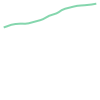

In [18]:
df_rail.geometry[0]

In [19]:
df_rail.head(50)

,id,geom:1,geometry
0,1,0105000020E61000000100000001020000001300000004...,"LINESTRING (117.01367 52.06945, 117.07109 52.0..."
1,2,0105000020E61000000100000001020000002300000058...,"LINESTRING (91.10172 53.57645, 90.95557 53.575..."
2,3,0105000020E61000000100000001020000005F000000DA...,"LINESTRING (97.95192 55.94242, 97.84468 55.934..."
3,4,0105000020E6100000010000000102000000050000004E...,"LINESTRING (118.12918 50.25033, 118.10700 50.2..."
4,5,0105000020E6100000010000000102000000800000003D...,"LINESTRING (114.52750 51.64029, 114.52327 51.6..."
5,6,0105000020E61000000100000001020000006400000098...,"LINESTRING (107.63455 51.81058, 107.58977 51.7..."
6,7,0105000020E61000000100000001020000004B00000014...,"LINESTRING (105.88475 49.20835, 105.84591 49.1..."
7,8,0105000020E6100000010000000102000000840000003C...,"LINESTRING (94.59940 55.91340, 94.55504 55.903..."
8,9,0105000020E6100000010000000102000000A3030000F2...,"LINESTRING (98.05490 55.91693, 98.26260 56.056..."
9,10,0105000020E6100000010000000102000000080000006C...,"LINESTRING (104.42041 49.03006, 104.40679 49.0..."


In [20]:
lats = []
lons = []
for i in df_rail['geometry']:
    lons = lons+i.coords.xy[0].tolist()
    lats = lats+i.coords.xy[1].tolist()
    lons.append(None)
    lats.append(None)

In [21]:
fig_rail = px.line_mapbox(df_rail, lat=lats, lon=lons,
                          mapbox_style=mapbox_style,
                          center=map_center_start, zoom=map_zoom_start,
                          color_discrete_sequence=['black']
                        #   color=lats

                          # hover_name='name',
                          # hover_data=None
                          )


fig_rail.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig_rail.show()